Export Controlled: ECCN EAR1E998

Warning: This document contains technical data whose export is restricted by the Bureau of Industry & Security’s Export Administration Regulations and cannot be exported or re-exported without the authorization of the U.S. government. Violations of these export laws are subject to severe criminal penalties. Diversion contrary to U.S. law is prohibited.

Start with:

* supply fan power of AHU36, time series data of one year
* labels (manual labeled with domain knowledge)

Objective:

* anomaly detection algorithms to automatically recognize abnormal SF operation

Here, we'll be using 3 different anomaly detection frames:
* Anomaly detection using single algorithm: UnsupervisedAD
* Anomaly detection using a batch of algorithms simultanneously
* Anomaly detection based on contribution from a batch of algorithms

In [1]:
import pandas as pd
import numpy as np
from UTCDAL.Design.TimeseriesAnalysis import features, extract_features
import altair as alt
alt.renderers.enable('notebook')
%matplotlib inline
%load_ext autoreload
%autoreload 2

## Load raw data, labels and also features

In [2]:
df = pd.read_csv(r'.\fan_power_new_label_36&37\sf_ahu_raw_36.csv', index_col=0, parse_dates=True)
labels = pd.read_csv(r'.\fan_power_new_label_36&37\fan_power_label_new.csv', index_col=0, parse_dates=True)
df.head(10)

,values
2016-05-01 00:00:00,0.000375
2016-05-01 00:01:00,0.000369
2016-05-01 00:02:00,0.000655
2016-05-01 00:03:00,0.001391
2016-05-01 00:04:00,0.001001
2016-05-01 00:05:00,0.001370
2016-05-01 00:06:00,0.001106
2016-05-01 00:07:00,0.000917
2016-05-01 00:08:00,0.000879
2016-05-01 00:09:00,0.000843


In [3]:
labels.head()

,label
date,
2016-05-01,weekend_normal
2016-05-02,workday_normal
2016-05-03,workday_normal
2016-05-04,workday_normal
2016-05-05,workday_normal


## Generate features using UTCDAL.Design.TimeseriesAnalysis module. For time saving, we have generated features
We can also use customized feature set

In [4]:
df = df.resample('1min').mean()
df.fillna(method='bfill', inplace=True)
df['ID'] = [d.strftime('%Y-%m-%d') for d in df.index]
if 0:
    ft = extract_features(df, features)
ft = pd.read_csv('fan_power_selected_features.csv', index_col=0)

In [5]:
ft.head()

,pd_quantile_0.3,kurtosis_pearson,segment_07_std,burstiness,segment_07_max,autocorrelation__3,fft_coefficient__56__real,partial_autocorrelation__3,change_quantiles__ql_0.8__qh_1.0__isabs_False__f_agg_mean,fft_coefficient__51__real,...,spread_mad,fft_coefficient__34__real,fft_coefficient__ 0__angle,fft_coefficient__87__real,fft_coefficient__71__angle,fft_coefficient__32__angle,change_quantiles__ql_0.0__qh_0.2__isabs_False__f_agg_var,fft_coefficient__36__abs,fft_coefficient__67__real,fft_coefficient__22__abs
ID,,,,,,,,,,,,,,,,,,,,,
2016-05-02,-0.272818,-0.205456,-0.224993,0.123144,-0.226064,0.131077,0.247374,-0.432260,0.693420,0.988101,...,-0.193793,-0.832627,0.095083,0.814357,1.379527,0.357897,-0.158343,-2.528364,0.680717,0.876289
2016-05-03,-0.273454,-0.290745,-0.224708,0.206983,-0.224939,0.102888,-0.413644,-0.535105,0.166290,0.249843,...,-0.534887,-0.372922,0.678842,0.845606,0.445365,-0.363435,-0.158366,-0.135668,0.511499,0.667722
2016-05-04,-0.272633,-0.291266,-0.223953,0.205593,-0.224954,0.109767,-0.428447,-0.398080,0.008476,0.251842,...,-0.689622,-0.316516,0.591975,0.974066,0.516621,-0.204851,-0.158350,-0.086312,0.505424,0.373963
2016-05-05,-0.272070,-0.232741,-0.222564,0.257276,-0.222090,0.042868,-0.702431,-0.305210,0.848746,1.739055,...,1.322519,-0.281900,0.347302,0.792159,1.001386,0.182438,-0.158356,-0.246904,1.678513,0.819947
2016-05-06,-0.271983,-0.256392,-0.223792,0.243201,-0.223582,0.122414,-0.481810,-1.390613,0.547948,2.105750,...,2.120096,-0.065398,0.426431,0.594334,1.586247,0.122605,-0.158323,0.149428,1.584058,0.909151


Since workday and weenkend has different situations for most CBDs, we only analyze the workday data

In [6]:
labels['num'] = labels.label.apply(lambda x: 1 if 'abnormal' in x else 0)
labels['is_workday'] = [1 if d < 5 else 0 for d in pd.to_datetime(labels.index).weekday]
labels_wd = labels[labels.is_workday==1]
y_true = labels_wd.num.values

In [7]:
df_ori = df.drop('ID', axis=1).resample('10min').mean()
df_ori['ID'] = [d.strftime('%Y-%m-%d') for d in df_ori.index]
df_ori['time'] = df_ori.index
df_ori.reset_index(drop=True, inplace=True)

# Part I: Anomaly detection using single algorithm 

In [8]:
from UTCDAL.Design.AnomalyDetection.detection import UnsupervisedAD
ad = UnsupervisedAD('IForest') 

## Train anomaly model

In [9]:
y_pred = ad.fit_predict(ft) ##model training and prediction

In [10]:
# ad.save_model(ad, 'ad.pkl') # save fitted model
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [11]:
anomaly_score = ad.anomaly_score(ft) ## predict anomaly scores for each samples

In [12]:
ad.detect_score(y_true, y_pred) ## classification metrics for anomaly detection

,TN,TP,FN,FP,accuracy,recall,precision,f1,time_complexity
IForest,25,229,1,4,0.980695,0.862069,0.961538,0.909091,0.18752


## Visualization for anomaly methods
feature visualization in 2D space with no label information

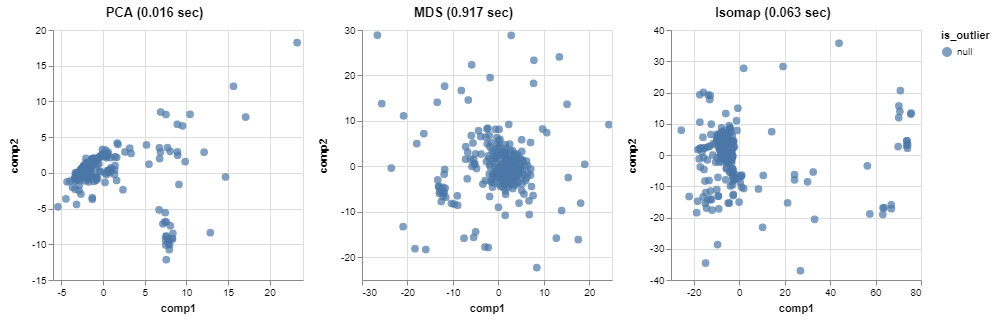

In [13]:
ad.iplot_features(ft, methods=['PCA', 'MDS', 'Isomap'])

feature visualization with label information

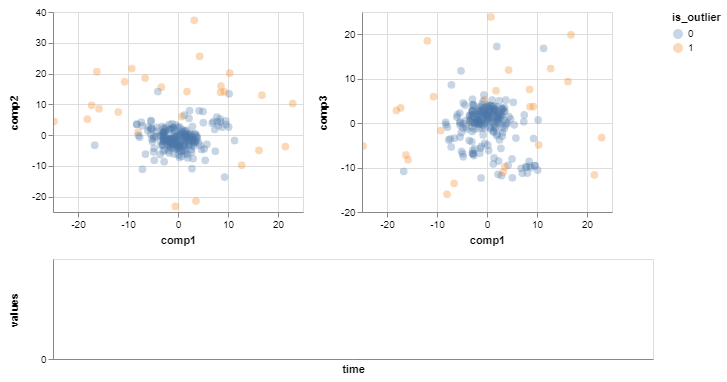

In [14]:
ad.iplot_predicts(ft, y_pred, X_raw=df_ori, max_rows=100000, method='MDS')

Visualization for daily anomaly scores

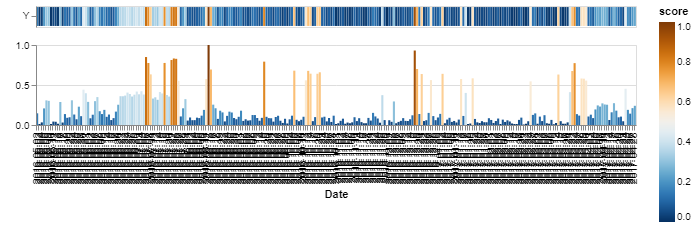

In [15]:
ad.iplot_heatmap_anomaly(anomaly_score, ft.index) ## anomaly score visualization using heatmap

Plotting time waveform from misclassification data

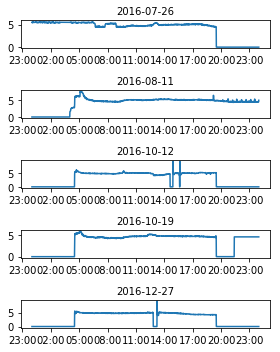

In [16]:
ad.plot_incorrect(df, y_true, y_pred, ID=ft.index) ##plot misclassified data

Plotting time waveform from predicted abnormal data

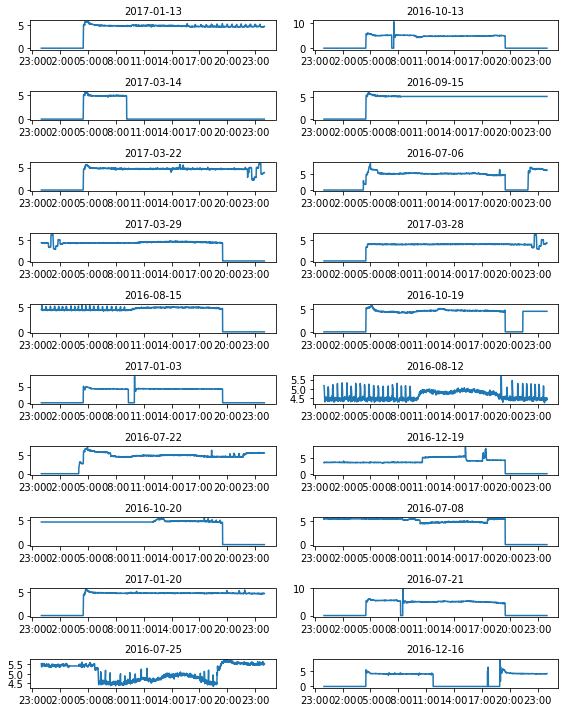

In [17]:
ad.plot_anomalies(df, y_pred, ft.index, max_cases=20) 

Plotting time waveform with highest anomaly score

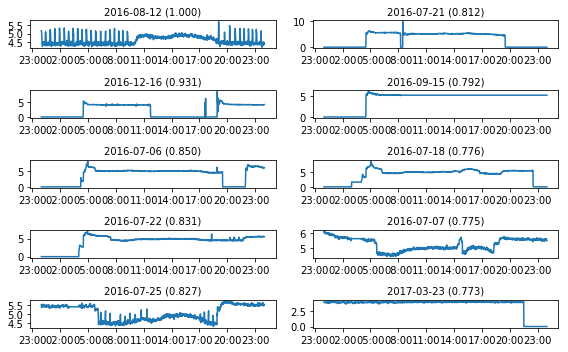

In [18]:
ad.plot_top_anomalies(df, anomaly_score, ft.index, ncols=2)

Plotting time waveform from predicted normal data

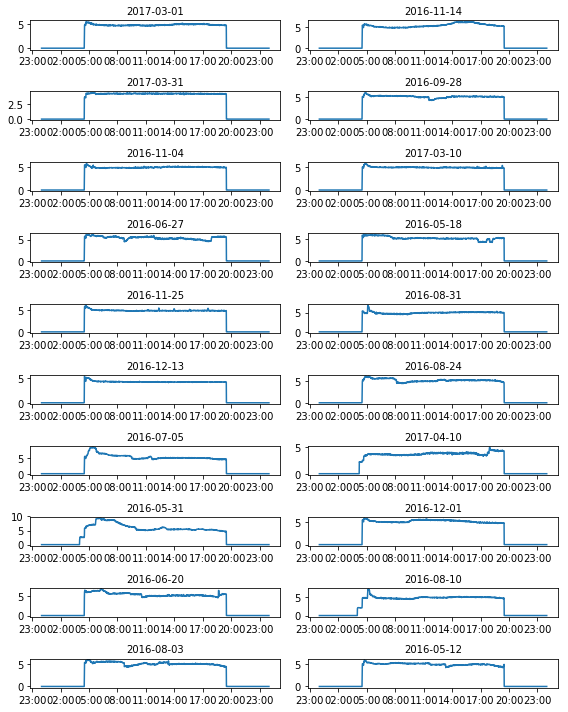

In [19]:
ad.plot_normal(df, y_pred, ft.index, max_cases=20, ncols=2)

## Part II: Anomaly detection using multiple algorithms simultaneously

In [20]:
from UTCDAL.Design.AnomalyDetection.detection import ADMulti
adm = ADMulti()

### Training model

In [21]:
adm.fit(ft)

C:\Users\zhouhait\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\covariance\robust_covariance.py:622: UserWarning: The covariance matrix associated to your dataset is not full rank
  warnings.warn("The covariance matrix associated to your dataset "


In [22]:
anomaly_score = adm.anomaly_score(ft)
anomaly_score.head()

algorithms,OCSVM,MCD,FastABOD,LOF,CBLOF,KNN,HBOS,IForest
ID,,,,,,,,
2016-05-02,0.246737,2.085035e-07,0.005801,0.232350,0.130931,0.154980,0.298574,0.178029
2016-05-03,0.046379,1.032135e-07,0.300829,0.005840,0.012950,0.026442,0.032925,0.030327
2016-05-04,0.044943,6.325835e-08,0.231346,0.004934,0.011333,0.008598,0.016477,0.010117
2016-05-05,0.339289,1.144624e-07,0.003143,0.112001,0.105371,0.122278,0.337000,0.192406
2016-05-06,0.488574,2.136710e-07,0.000788,0.211773,0.137097,0.158533,0.404009,0.226851


### Visualization for anomaly methods
Visualization for daily anomaly scores for different methods

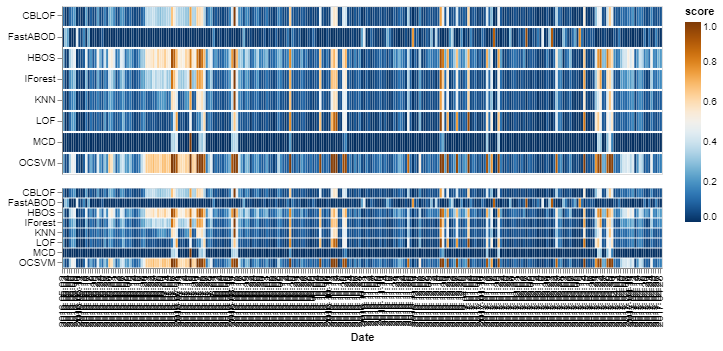

In [23]:
adm.iplot_heatmap_anomaly(anomaly_score, ID=ft.index) ## anomaly score visualization based on different methods 

In [24]:
y_preds = adm.predict(ft)
adm.detect_score(y_true, y_preds)## classification metrics for anomaly detection

,TN,TP,FN,FP,accuracy_score,recall_score,precision_score,f1_score,time_complexity
OCSVM,228,24,2,5,0.972973,0.827586,0.923077,0.872727,0.003202
MCD,225,21,5,8,0.949807,0.724138,0.807692,0.763636,0.000000
FastABOD,222,19,8,10,0.930502,0.655172,0.703704,0.678571,0.062506
LOF,227,17,3,12,0.942085,0.586207,0.850000,0.693878,0.015627
CBLOF,228,24,2,5,0.972973,0.827586,0.923077,0.872727,0.000000
KNN,228,22,2,7,0.965251,0.758621,0.916667,0.830189,0.046880
HBOS,230,26,0,3,0.988417,0.896552,1.000000,0.945455,0.036342
IForest,229,25,1,4,0.980695,0.862069,0.961538,0.909091,0.035094


feature visualization in 2D space with label information

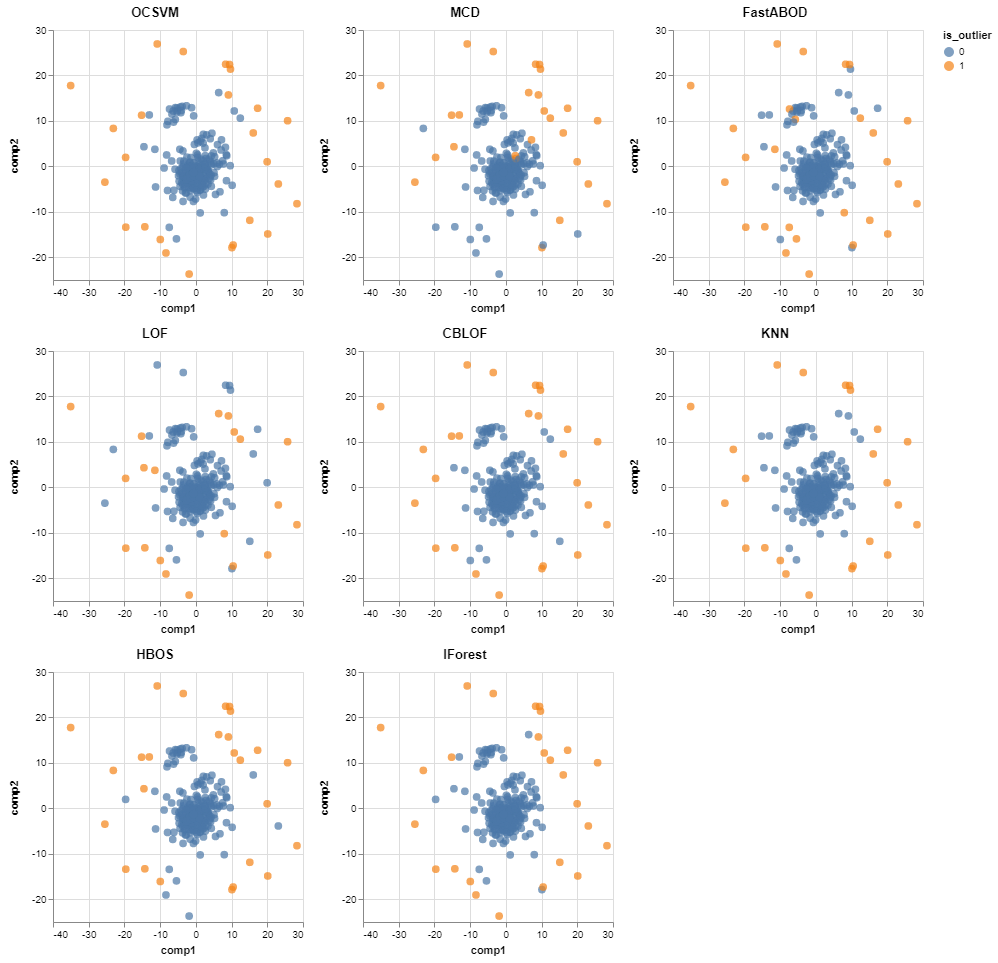

In [25]:
adm.iplot_predicts(ft, y_preds)

## Part III: Anomaly detection based on multiple algorithms contribution

In [26]:
from UTCDAL.Design.AnomalyDetection import ADChannel
adc = ADChannel(n_votes=2) # An outlier should be detected with at least 2 methods

### Training model

In [27]:
adc.fit(ft)

C:\Users\zhouhait\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\covariance\robust_covariance.py:622: UserWarning: The covariance matrix associated to your dataset is not full rank
  warnings.warn("The covariance matrix associated to your dataset "


### Visualization for anomaly methods
Visualization for daily summed anomaly scores from selected methods

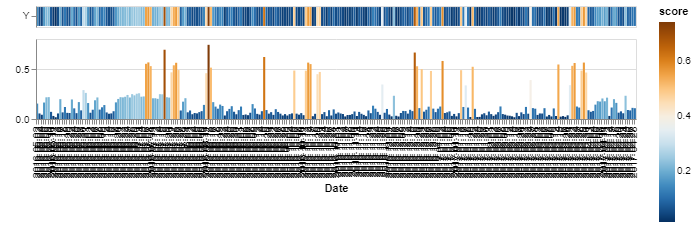

In [28]:
y_pred = adc.predict(ft)
anomaly_score = adc.anomaly_score(ft)
adc.iplot_heatmap_anomaly(anomaly_score, ft.index)

feature visualization in 2D space with no label information

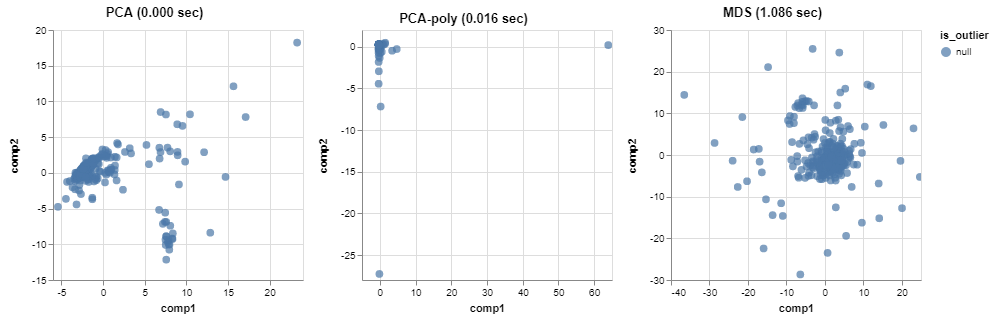

In [29]:
adc.iplot_features(ft, methods=['PCA', 'PCA-poly', 'MDS'])

feature visualization with label information

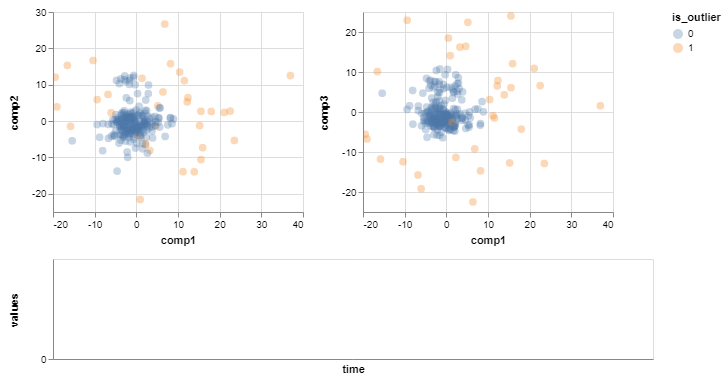

In [30]:
adc.iplot_predicts(ft, y_pred, X_raw=df_ori, max_rows=100000, method='MDS')

Plotting time waveform from misclassification data

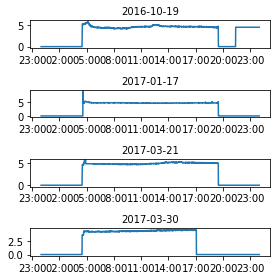

In [31]:
adc.plot_incorrect(df, y_true, y_pred, ID=ft.index)

Plotting time waveform from predicted abnormal data

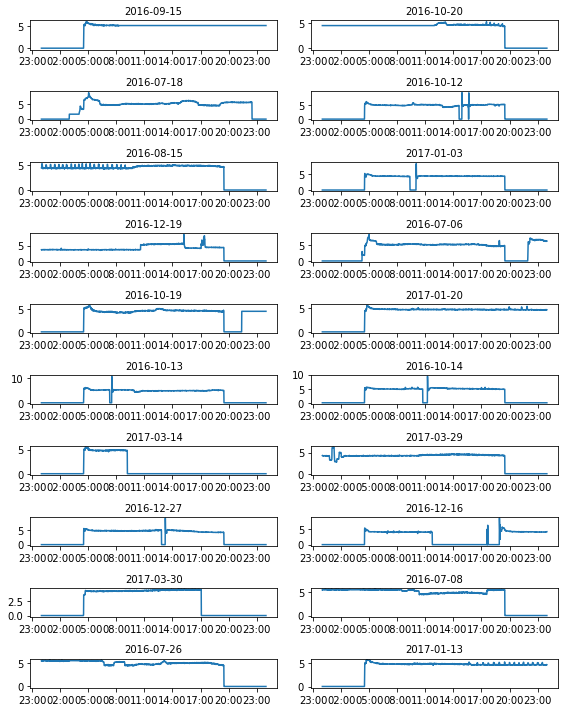

In [32]:
adc.plot_anomalies(df, y_pred, ID=ft.index, max_cases=20)

Plotting time waveform with highest anomaly scores

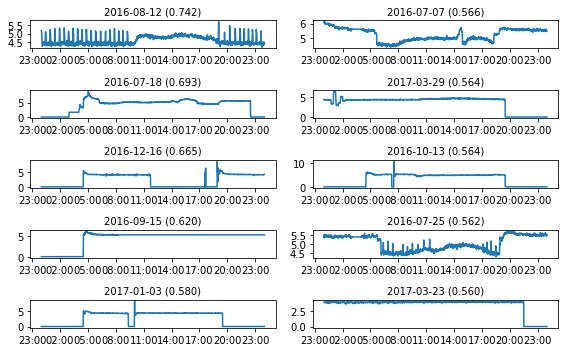

In [33]:
adc.plot_top_anomalies(df, anomaly_score, ID=ft.index, ncols=2)